In [1]:
%matplotlib notebook

import argparse
import time
import os


In [2]:

import matplotlib.pyplot as plt
from data import NoisyBSDSDataset
from argument import Args
from model import DnCNN, UDnCNN, DUDnCNN, QDUDnCNN
import nntools as nt
from utils import DenoisingStatsManager, plot

import cv2
import numpy as np
import torch


In [3]:

import torch.utils.data as td
import torch.quantization.quantize_fx as quantize_fx
from torch.quantization.fuse_modules import fuse_known_modules
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as td
import torchvision as tv
from PIL import Image
import model
import inference

In [4]:
class NoisyBSDSDataset(td.Dataset):

    def __init__(self, root_dir, mode='train', image_size=(180, 180), sigma=30):
        super(NoisyBSDSDataset, self).__init__()
        self.mode = mode
        self.image_size = image_size
        self.sigma = sigma
        self.images_dir = os.path.join(root_dir, mode)
        self.files = os.listdir(self.images_dir)

    def __len__(self):
        return len(self.files)

    def __repr__(self):
        return "NoisyBSDSDataset(mode={}, image_size={}, sigma={})". \
            format(self.mode, self.image_size, self.sigma)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.files[idx])
        clean = Image.open(img_path).convert('RGB')   
        # random crop
        i = np.random.randint(clean.size[0] - self.image_size[0])
        j = np.random.randint(clean.size[1] - self.image_size[1])
        
        clean = clean.crop([i, j, i+self.image_size[0], j+self.image_size[1]])
        transform = tv.transforms.Compose([
            # convert it to a tensor
            tv.transforms.ToTensor(),
            # normalize it to the range [−1, 1]
            tv.transforms.Normalize((.5, .5, .5), (.5, .5, .5))
            ])
        clean = transform(clean)
        
        noisy = clean + 2 / 255 * self.sigma * torch.randn(clean.shape)
        return noisy, clean

In [5]:
def myimshow(image, ax=plt):
    image = image.to('cpu').numpy()
    image = np.moveaxis(image, [0, 1, 2], [2, 0, 1])
    image = (image + 1) / 2
    image[image < 0] = 0
    image[image > 1] = 1
    h = ax.imshow(image)
    ax.axis('off')
    return h

In [6]:
"""
def load_model(path, D=6, C=64, device=torch.device('cpu')):
    net = model.DUDnCNN(D, C)
    checkpoint = torch.load(path, map_location=torch.device('cpu'))
    if 'QAT' not in checkpoint:
        net.load_state_dict(checkpoint['Net'])
    net.eval()

    return net.to(device), checkpoint.get('QAT')

def load_model_q(path, D=6, C=64, device=torch.device('cpu')):
    net = model.QDUDnCNN(D, C)
    checkpoint = torch.load(path, map_location=torch.device('cpu'))
    if 'QAT' not in checkpoint:
        net.load_state_dict(checkpoint['Net'])
    net.eval()

    return net.to(device), checkpoint.get('QAT')
"""

"\ndef load_model(path, D=6, C=64, device=torch.device('cpu')):\n    net = model.DUDnCNN(D, C)\n    checkpoint = torch.load(path, map_location=torch.device('cpu'))\n    if 'QAT' not in checkpoint:\n        net.load_state_dict(checkpoint['Net'])\n    net.eval()\n\n    return net.to(device), checkpoint.get('QAT')\n\ndef load_model_q(path, D=6, C=64, device=torch.device('cpu')):\n    net = model.QDUDnCNN(D, C)\n    checkpoint = torch.load(path, map_location=torch.device('cpu'))\n    if 'QAT' not in checkpoint:\n        net.load_state_dict(checkpoint['Net'])\n    net.eval()\n\n    return net.to(device), checkpoint.get('QAT')\n"

In [7]:
def img_to_tensor(img, device):
    tensor = torch.FloatTensor(img).to(device)
    tensor = tensor.permute([2, 0, 1]) / 255.
    tensor = (tensor - 0.5) / 0.5

    return tensor.unsqueeze(0)

In [8]:
def tensor_to_img(tensor):
    tensor = tensor[0].permute([1, 2, 0])
    tensor = (tensor * 0.5 + 0.5) * 255
    tensor = tensor.clamp(0, 255)
    return tensor.cpu().numpy().astype(np.uint8)

In [9]:
def quantize_model(quantize_type, model, input_example=None, qat_state=None):
    if quantize_type == 'dynamic':
        model = torch.quantization.quantize_dynamic(
            model,
            {torch.nn.Conv2d},
            dtype=torch.qint8
        )
    elif quantize_type == 'static':
        model.qconfig = torch.quantization.get_default_qconfig('fbgemm')
        for i in range(len(model.bn)):
            conv, bn = model.conv[i+1], model.bn[i]
            conv_new, bn_new = fuse_known_modules([conv, bn])
            setattr(model.conv, str(i+1), conv_new)
            setattr(model.bn, str(i), bn_new)
        model_fp32_fused = model
        model_fp32_prepared = torch.quantization.prepare(model_fp32_fused)
        if input_example is not None:
            model_fp32_prepared(input_example)
        model = torch.quantization.convert(model_fp32_prepared)
    elif quantize_type == 'fx_dynamic':
        qconfig_dict = {"": torch.quantization.default_dynamic_qconfig}
        # prepare
        model_prepared = quantize_fx.prepare_fx(model, qconfig_dict)
        # no calibration needed when we only have dynamici/weight_only quantization
        # quantize
        model = quantize_fx.convert_fx(model_prepared)
    elif quantize_type == 'fx_static':
        #qconfig_dict = {"": torch.quantization.get_default_qconfig('qnnpack')}
        qconfig_dict = {"": torch.quantization.get_default_qconfig('fbgemm')}
        # prepare
        model_prepared = quantize_fx.prepare_fx(model, qconfig_dict)
        # calibrate (not shown)
        if input_example is not None:
            model_prepared(input_example)
        # quantize
        model = quantize_fx.convert_fx(model_prepared)
        if qat_state is not None:
            model.load_state_dict(qat_state)

    return model

In [10]:
def main(img_set,model_path,qat=False,quantize='none'):
    args = Args()
    args.quantize = quantize
    device = 'cpu'
    if qat:
        denoise, qat_state = inference.load_model(model_path, QDUDnCNN, args.D, args.C, device=device)
    else:
        denoise, qat_state = inference.load_model(model_path, DUDnCNN, args.D, args.C, device=device)

    img = []
    titles = ['clean', 'noise', 'denoise']
    x, clean = img_set
    x = x.unsqueeze(0).to(device)
    img.append(clean)
    img.append(x[0])

    if args.quantize:
        print('Quantize model...'+quantize)
        denoise = quantize_model(args.quantize, denoise, input_example=x, qat_state=qat_state)

    t = time.time()
    with torch.no_grad():
        y = denoise(x)
    img.append(y[0])

    print(f'Elapsed: {(time.time() - t) * 1000:.2f}ms')
    print(f'Image size is {x[0].shape}.')
    
    fig, axes = plt.subplots(ncols=3, figsize=(9,5), sharex='all', sharey='all')
    for i in range(len(img)):
        myimshow(img[i], ax=axes[i])
        axes[i].set_title(f'{titles[i]}')

In [11]:
dataset_root_dir = os.environ.get('DATA_DIR')+'/images'
test_set = NoisyBSDSDataset(dataset_root_dir, mode='test', image_size=(320, 320))

In [12]:
path = os.environ.get('TRAINING_DIR')+'/no_qat/checkpoint.pth'
args = Args()
denoise = inference.load_model(path,model.QDUDnCNN,args.D,args.C,device='cpu')

In [13]:

def eval_q(img_set,model_path,qat=False,quantize='none',display=False): 
    args = Args()
    args.quantize = quantize
    device = 'cpu'
    if qat:
        denoise, qat_state = inference.load_model(model_path, QDUDnCNN, args.D, args.C, device=device)
    else:
        denoise, qat_state = inference.load_model(model_path, DUDnCNN, args.D, args.C, device=device)
    
    img = []
    titles = ['clean', 'noise', 'denoise'] 
    x, clean = img_set
    x = x.unsqueeze(0).to(device)
    
    if display:
        img.append(clean)
        img.append(x[0])

    if args.quantize:
        denoise = quantize_model(args.quantize, denoise, input_example=x, qat_state=qat_state)

    t = time.time()
    with torch.no_grad():
        y = denoise(x) 
    if display:
        img.append(y[0])
#    print(f'Elapsed: {(time.time() - t) * 1000:.2f}ms')

    if display:
        fig, axes = plt.subplots(ncols=3, figsize=(9,5), sharex='all', sharey='all')
        for i in range(len(img)):
            myimshow(img[i], ax=axes[i])
            axes[i].set_title(f'{titles[i]}') 
    return (time.time() - t) * 1000, quantize

In [14]:
img_set = test_set[1]
path = os.environ.get('TRAINING_DIR')+'/no_qat/checkpoint.pth'
print("No QAT")

No QAT


Quantize model...none
Elapsed: 2377.56ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


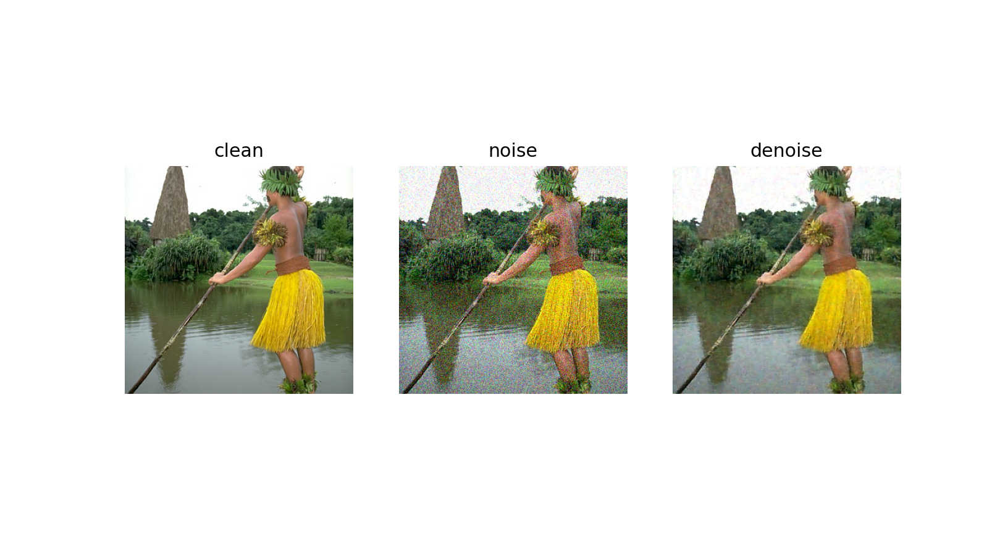

In [15]:
main(img_set,path,False,'none')

In [ ]:
#main(img_set,path,False,'static')

Quantize model...dynamic
Elapsed: 2166.31ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


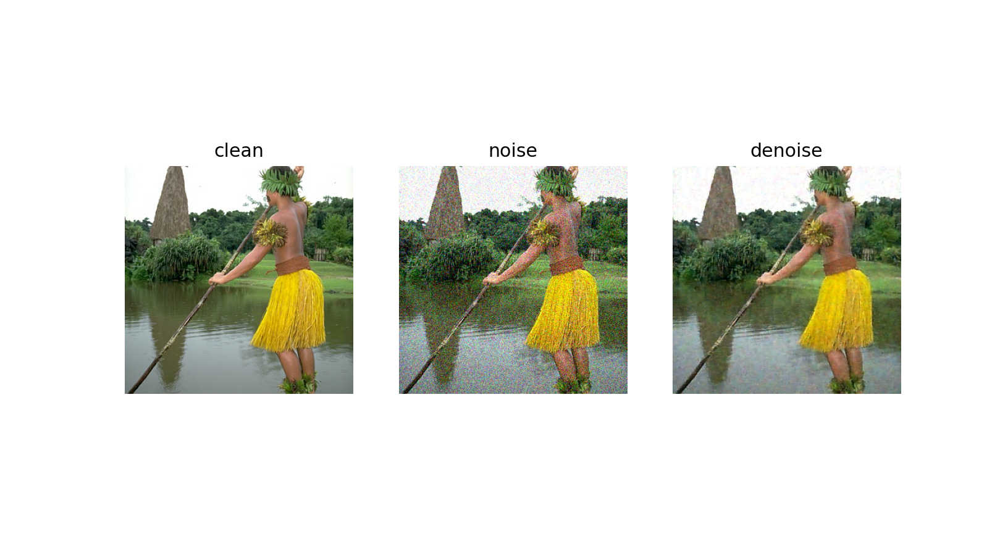

In [17]:
main(img_set,path,False,'dynamic')

Quantize model...fx_static
Elapsed: 1687.28ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


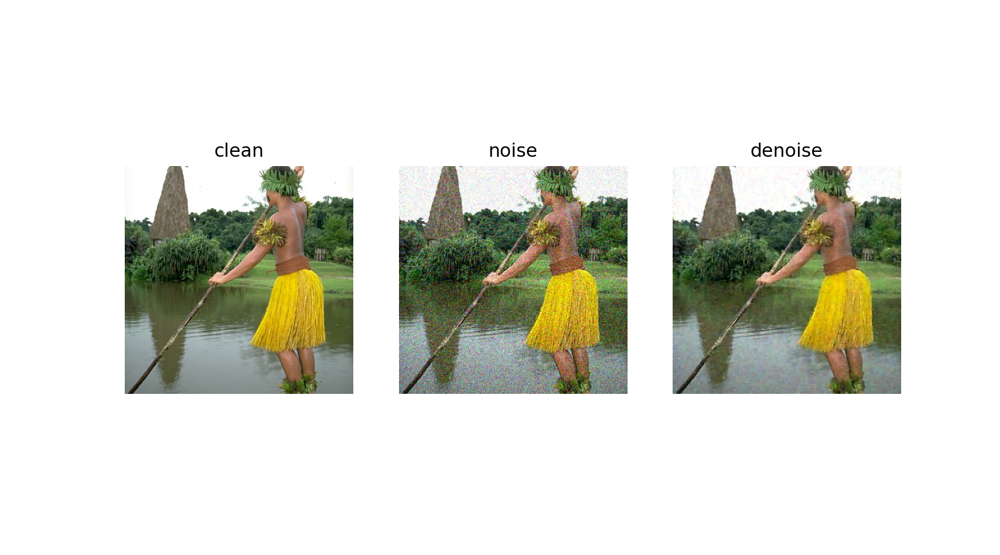

In [18]:
main(img_set,path,False,'fx_static')

Quantize model...fx_dynamic


/usr/local/lib/python3.6/dist-packages/torch/quantization/fx/quantization_patterns.py:444: UserWarning: dtype combination: (torch.float32, torch.qint8, torch.quint8) is not supported by Conv supported dtype combinations are: [(torch.quint8, torch.qint8, None)]
  "supported dtype combinations are: {}".format(dtypes, supported_dtypes))


Elapsed: 2110.74ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


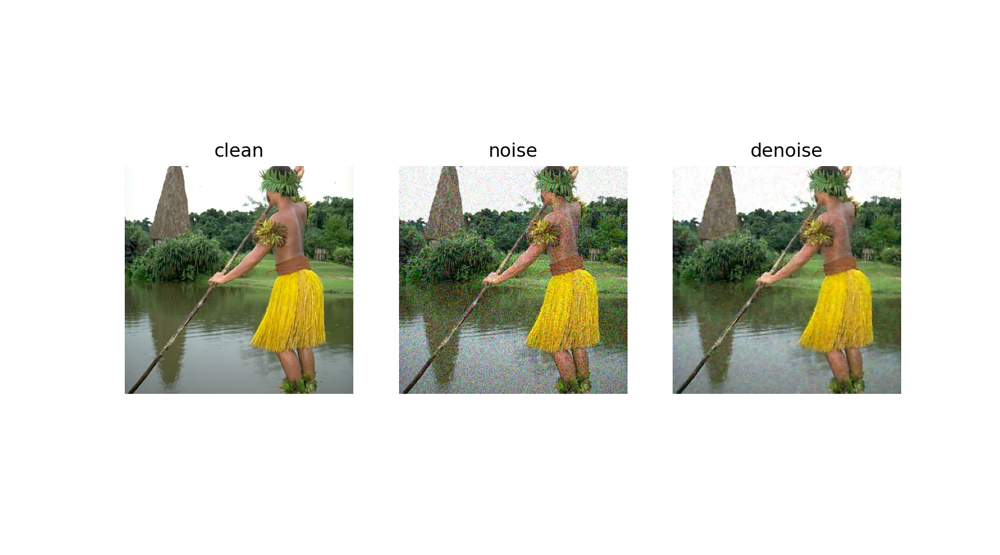

In [19]:
main(img_set,path,False,'fx_dynamic')

In [20]:
img_set = test_set[1]
path = os.environ.get('TRAINING_DIR')+'/qat/checkpoint.pth'
print('QAT')

QAT


Quantize model...none
Elapsed: 2026.14ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


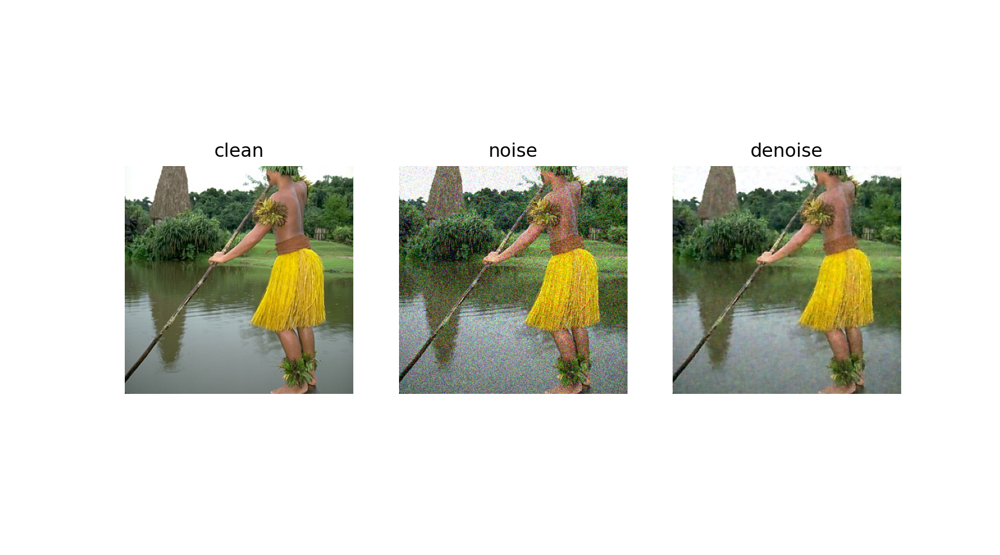

In [21]:
main(img_set,path,True,'none')

Quantize model...static
Elapsed: 1479.57ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


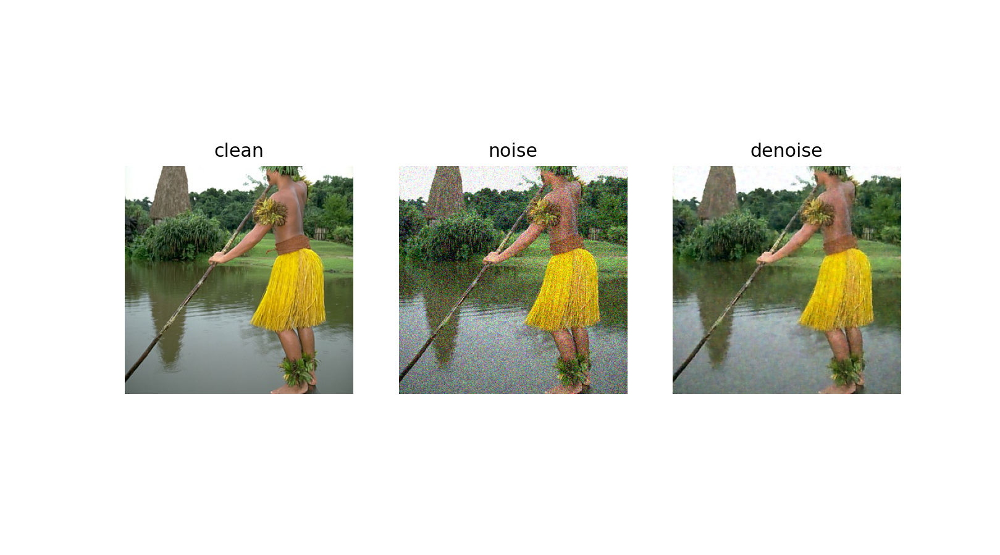

In [22]:
main(img_set,path,True,'static')

Quantize model...dynamic
Elapsed: 2009.06ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


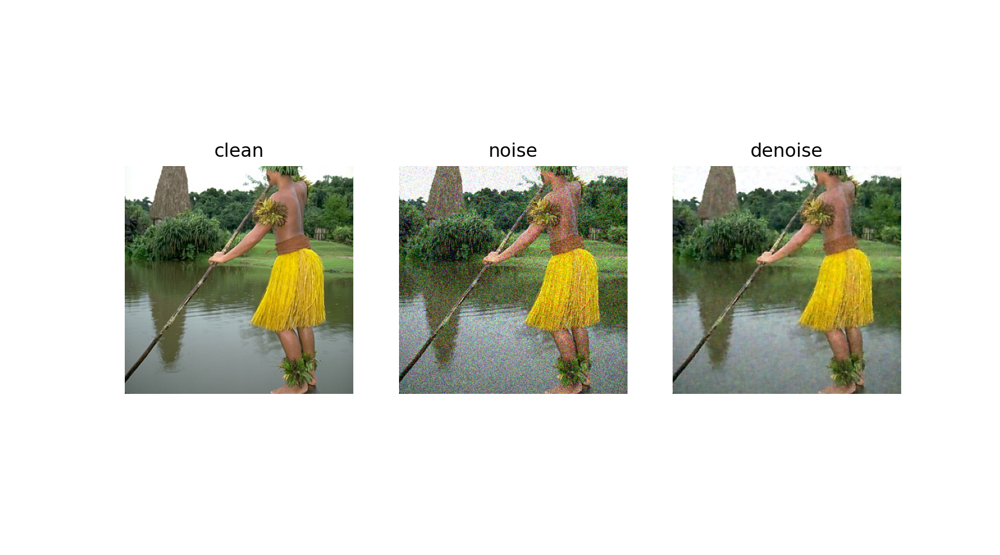

In [23]:
main(img_set,path,True,'dynamic')

Quantize model...fx_static
Elapsed: 1464.56ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


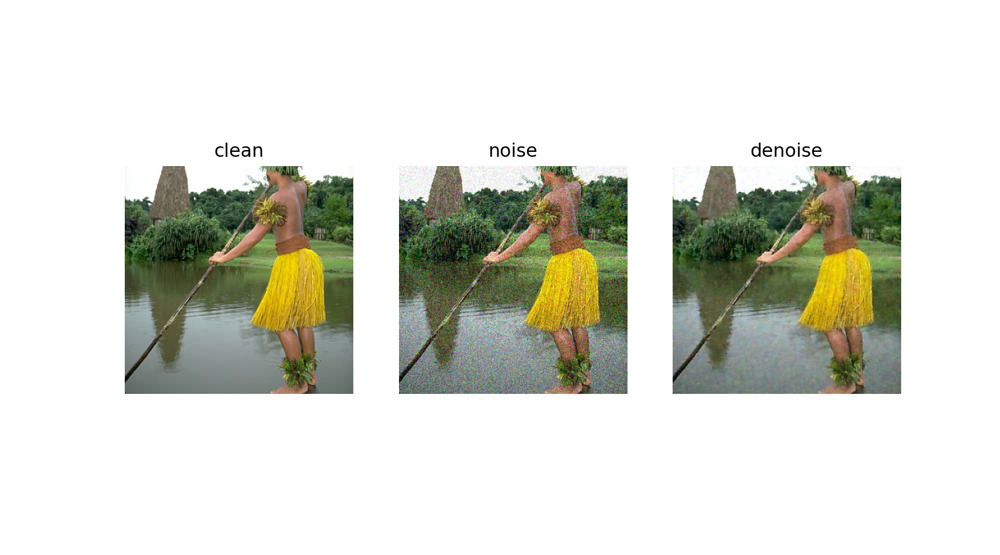

In [24]:
main(img_set,path,True,'fx_static')

Quantize model...fx_dynamic
Elapsed: 2077.35ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


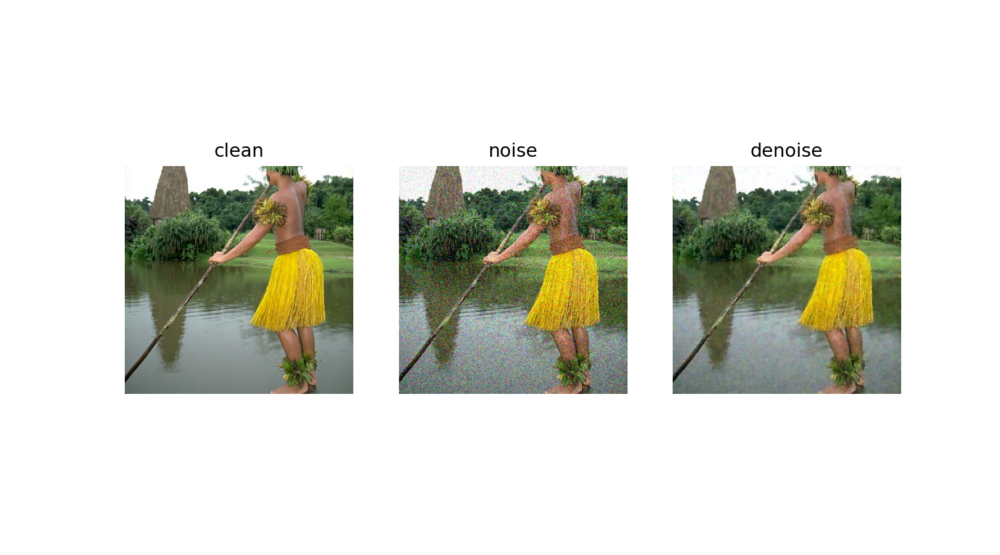

In [25]:
main(img_set,path,True,'fx_dynamic')

In [26]:
img_set = test_set[1]
path = os.environ.get('TRAINING_DIR')+'/qat_fx_static/checkpoint.pth'
print('QAT_FX_STATIC')

QAT_FX_STATIC


Quantize model...none
Elapsed: 1899.99ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


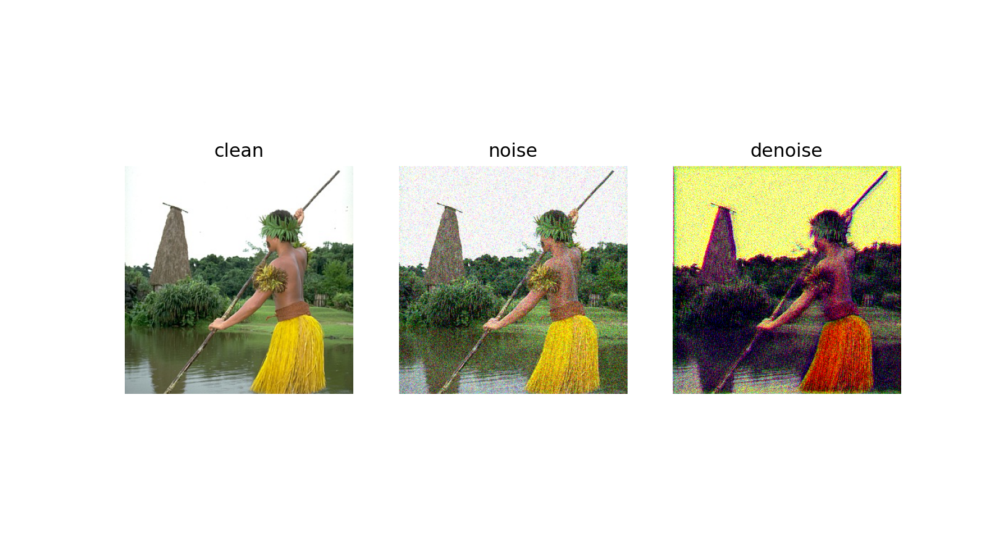

In [27]:
main(img_set,path,True,'none')

Quantize model...static
Elapsed: 1584.22ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


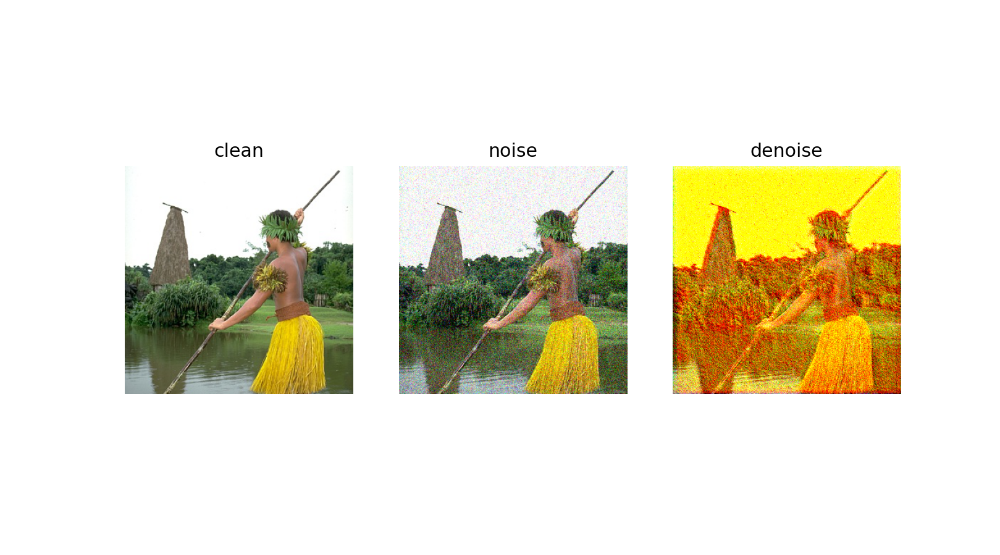

In [28]:
main(img_set,path,True,'static')

Quantize model...dynamic
Elapsed: 2060.50ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


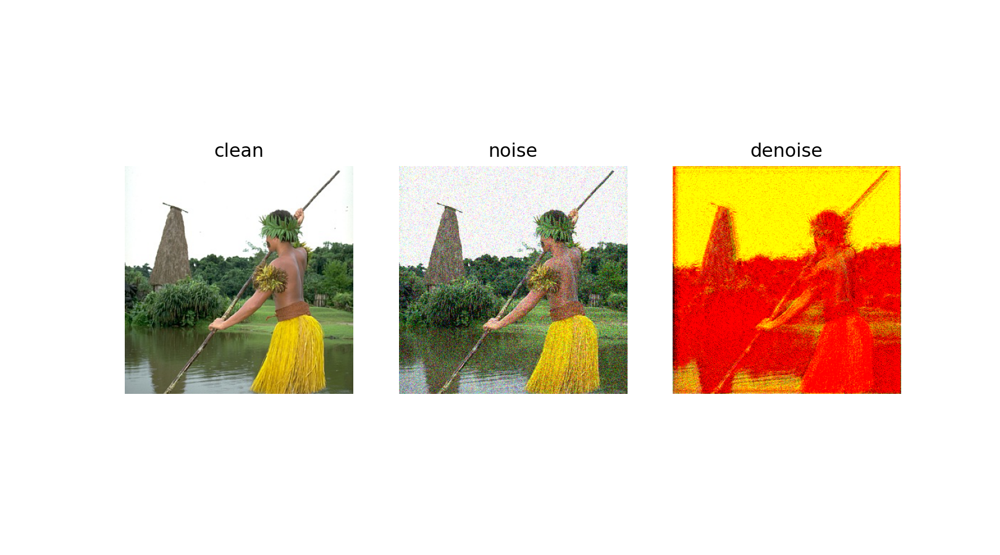

In [29]:
main(img_set,path,True,'dynamic')

Quantize model...fx_static
Elapsed: 1483.96ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


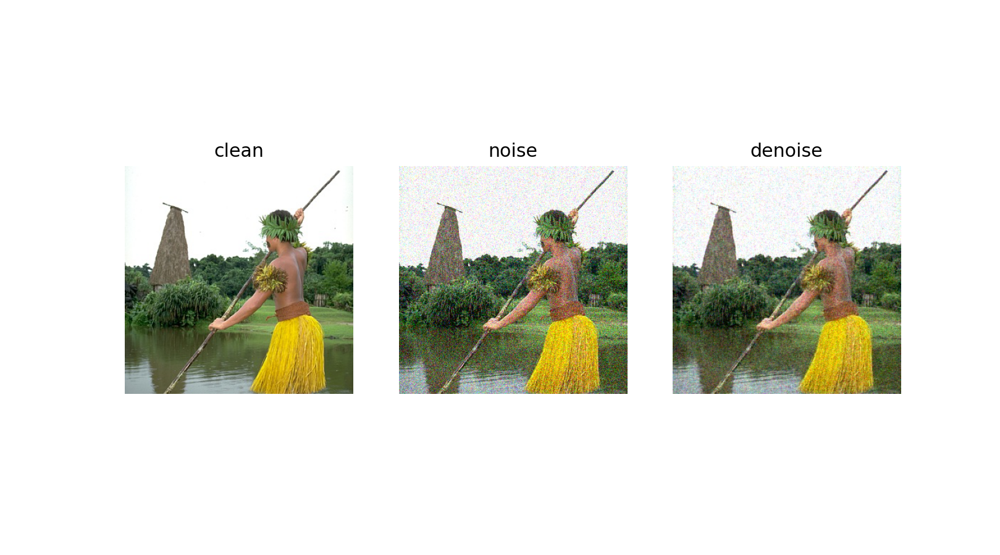

In [30]:
main(img_set,path,True,'fx_static')

Quantize model...fx_dynamic
Elapsed: 1961.92ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


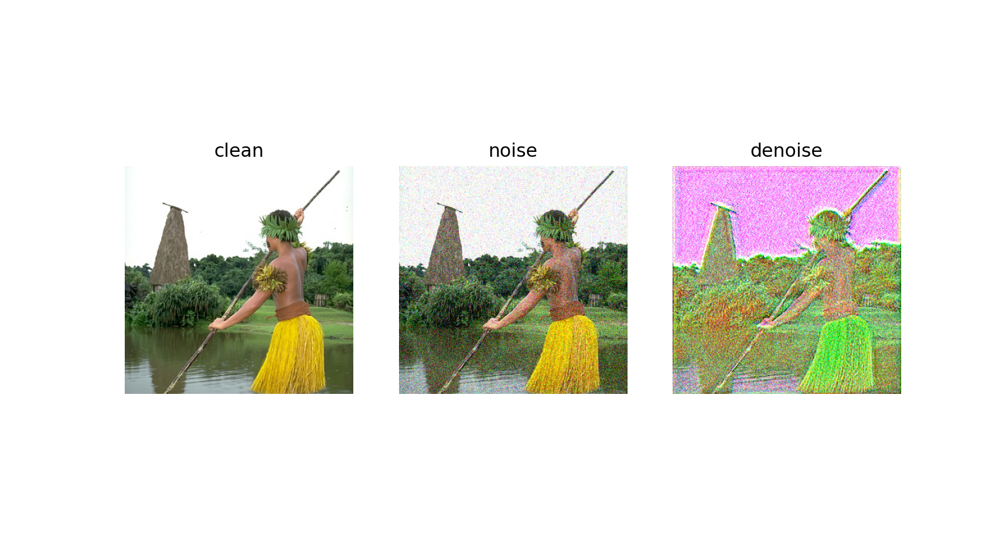

In [31]:
main(img_set,path,True,'fx_dynamic')

In [32]:
img_set = test_set[1]

In [33]:
path = os.environ.get('TRAINING_DIR')+'/no_qat/checkpoint.pth' 
print('Non-Quantization Aware Trained Model')
eval_time,q = eval_q(img_set, path, False,'none', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')
#eval_time,q = eval_q(img_set, path, False,'static', False) 
#print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, False,'dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, False,'fx_static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path,False, 'fx_dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')

Non-Quantization Aware Trained Model
Qntization - none: 1843.46ms
Qntization - dynamic: 1895.57ms
Qntization - fx_static: 1593.26ms
Qntization - fx_dynamic: 1978.92ms


In [34]:
path = os.environ.get('TRAINING_DIR')+'/qat/checkpoint.pth' 
print('Quantization Aware Trained Model')
eval_time,q = eval_q(img_set, path,True, 'none', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')
eval_time,q = eval_q(img_set, path,True, 'static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path,True, 'dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path,True, 'fx_static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path,True, 'fx_dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')

Quantization Aware Trained Model
Qntization - none: 2285.97ms
Qntization - static: 1693.88ms
Qntization - dynamic: 1901.67ms
Qntization - fx_static: 1579.73ms
Qntization - fx_dynamic: 1996.69ms


In [35]:
path = os.environ.get('TRAINING_DIR')+'/qat_fx_static/checkpoint.pth' 

In [37]:
print('Quantization Aware Trained Model')
eval_time,q = eval_q(img_set, path, True,'none', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')
eval_time,q = eval_q(img_set, path, True,'static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, True,'dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, True,'fx_static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, True,'fx_dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')

Quantization Aware Trained Model
Qntization - none: 2009.02ms
Qntization - static: 1700.37ms
Qntization - dynamic: 1966.95ms
Qntization - fx_static: 1599.97ms
Qntization - fx_dynamic: 2079.26ms
